# Разведочный анализ данных. Основные методы

In [25]:
from sklearn.datasets import fetch_california_housing as giveData
import pandas as pd
import numpy as np

def sklearn_to_df(sklearn_dataset):
    df = pd.DataFrame(sklearn_dataset.data, columns=sklearn_dataset.feature_names)
    df['target'] = pd.Series(sklearn_dataset.target)
    return df

dataset = giveData()
data = sklearn_to_df(dataset)
data.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [2]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   MedInc      20640 non-null  float64
 1   HouseAge    20640 non-null  float64
 2   AveRooms    20640 non-null  float64
 3   AveBedrms   20640 non-null  float64
 4   Population  20640 non-null  float64
 5   AveOccup    20640 non-null  float64
 6   Latitude    20640 non-null  float64
 7   Longitude   20640 non-null  float64
 8   target      20640 non-null  float64
dtypes: float64(9)
memory usage: 1.4 MB


In [8]:
# Замена NaN значений на 0: data.fillna(0) -_-
# Удаление столбцов, в которых не NaN элементов <3: df.dropna(axis = 1, thresh=3)

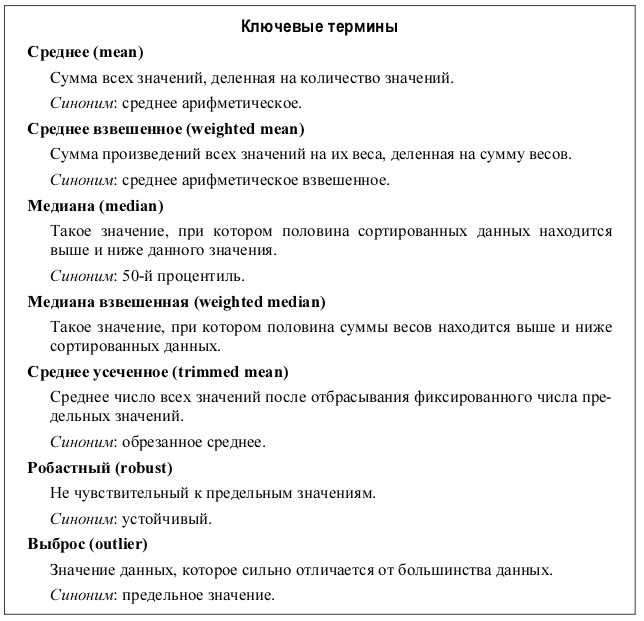

In [31]:
def quicksort(nums):
        if len(nums) <= 1:
           return nums
        else:
           q = nums[0]
           s_nums = []
           m_nums = []
           e_nums = []
           for n in nums:
               if n < q:
                   s_nums.append(n)
               elif n > q:
                   m_nums.append(n)
               else:
                   e_nums.append(n)
           return quicksort(s_nums) + e_nums + quicksort(m_nums)

def means(data): # Считаем среднее значение по всем столбцам
    mean = [data[column].mean() for column in data.columns]
    return mean

def w_mean(data, value,weight):
        d = data[value]
        w = data[weight]
        return (d * w).sum()/w.sum()    
def w_means(data): # Считаем среднее взвешенное по всем столбцам. Результат в виде словаря

    weighted_means = {column: [0.0]*(data.shape[1]) for column in data.columns}
    index = 0
    for idx, value_col in enumerate(data.columns):
        j = 0
        for weight_col in data[idx+1:]:
            weighted_means[value_col][j] = w_mean(data,value_col,weight_col)
            j +=1
        index +=1
    return weighted_means

def median(data): # Медиана по всем числовым столбцам
        return data.median()

def mediana(arr):
    sorted_col = quicksort(arr)
    n = len(arr)
    if n % 2 == 0:
        mid1 = n//2
        mid2 = mid1 - 1
        res = (sorted_col[mid2] + sorted_col[mid1])/2
    else:
        res = sorted_col[n//2]
    return res
    
def w_median(data,column, weight): # Считаем взвешенную медиану
    weights = np.array(data[weight])

    sorted_column = quicksort(data[column])
    cum_weights = np.cumsum(weights)
    half_total_weight = np.sum(weights)/2
    for i, cum_weight in enumerate(cum_weights):
        if cum_weight >= half_total_weight:
            return sorted_column[i]

def w_medians(data):#проверить и везде добавить проверку на является ли столбец числовым
    weighted_medians = {column: np.array([0.0]*(data.shape[1])) for column in data.columns}
    for idx, column in enumerate(data.columns):
        i = 0
        for weight in data[idx +1:]:
            weighted_medians[column][i] = w_median(data,column,weight)
            i +=1
    return weighted_medians


3.5347999999999997


MedInc           3.534800
HouseAge        29.000000
AveRooms         5.229129
AveBedrms        1.048780
Population    1166.000000
AveOccup         2.818116
Latitude        34.260000
Longitude     -118.490000
target           1.797000
dtype: float64

### Для нахождения выбросов, среднего усеченного и робастного воспользуемся следующими методами:

In [10]:
from scipy import stats

#Функция усеченного среднего для всех числовых столбцов
def trim_means(data,trim):
    res = {}
    for column in data.columns:
        if data[column].apply(lambda x: isinstance(x, float)).all():
            trim_mean = stats.trim_mean(data[column],trim) # вычисляем усеченное среднее одного столбца
            res[column] = trim_mean
    return res


{'MedInc': 3.654012203246124,
 'HouseAge': 28.494549418604652,
 'AveRooms': 5.252605874123591,
 'AveBedrms': 1.0531912643393202,
 'Population': 1256.5128997093022,
 'AveOccup': 2.8577994956014234,
 'Latitude': 35.50824915213178,
 'Longitude': -119.51812863372093,
 'target': 1.9277299539728683}

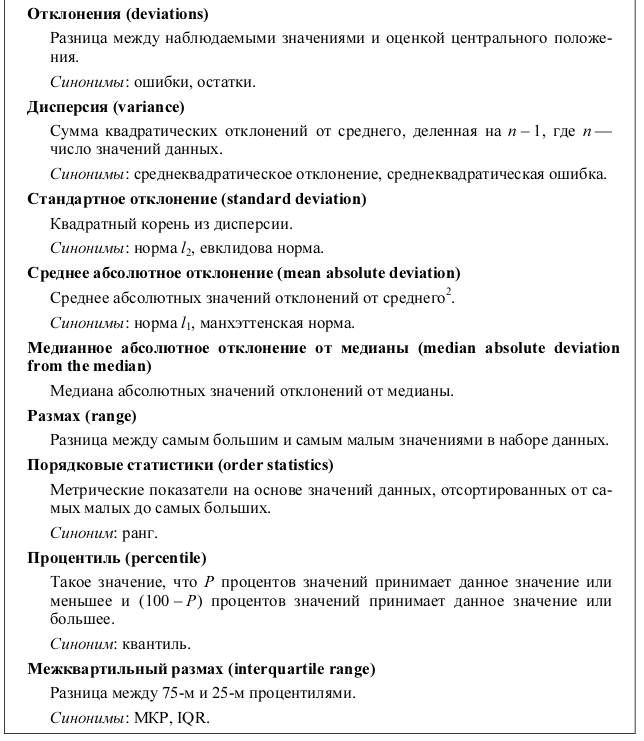

In [41]:
import statistics as st

# Считаем отклонения от центрального положения по всем столбцам
def deviations(data):
    res = {}
    for column in data.columns:
        if data[column].apply(lambda x: isinstance(x, float)).all() or data[column].apply(lambda x: isinstance(x, int)).all():
            res[column] = st.pstdev(data[column])
    return res

# Стандартное отклонение считается np.std(data) 
# Cчитаем медианное отклонение
def median_dev(data):
    m = data.median()
    res = []
    for column in data.columns:
        arr = []
        if data[column].apply(lambda x: isinstance(x,float)).all() or data[column].apply(lambda x: isinstance(x, int)).all():
            arr= [x-m[column] for x in data[column]]

            res.append(mediana(arr))
    return res

# Межквартильный размах
def IQR(arr):
    data = pd.DataFrame(arr)
    iqr = float(data.quantile(0.75) - data.quantile(0.25))
    return iqr


/tmp/ipykernel_9860/3083644823.py:26: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  iqr = float(data.quantile(0.75) - data.quantile(0.25))


3.5


[2.220446049250313e-16, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [14]:
data.describe().round(2)

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,target
count,20640.00,20640.00,20640.00,20640.00,20640.00,20640.00,20640.00,20640.00,20640.00
mean,3.87,28.64,5.43,1.10,1425.48,3.07,35.63,-119.57,2.07
std,1.90,12.59,2.47,0.47,1132.46,10.39,2.14,2.00,1.15
min,0.50,1.00,0.85,0.33,3.00,0.69,32.54,-124.35,0.15
25%,2.56,18.00,4.44,1.01,787.00,2.43,33.93,-121.80,1.20
50%,3.53,29.00,5.23,1.05,1166.00,2.82,34.26,-118.49,1.80
75%,4.74,37.00,6.05,1.10,1725.00,3.28,37.71,-118.01,2.65
max,15.00,52.00,141.91,34.07,35682.00,1243.33,41.95,-114.31,5.00


## Изучение распределений данных

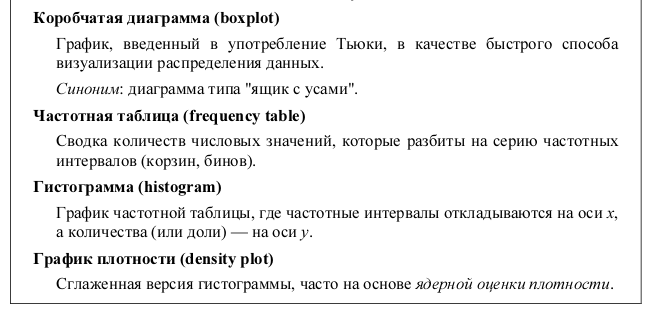

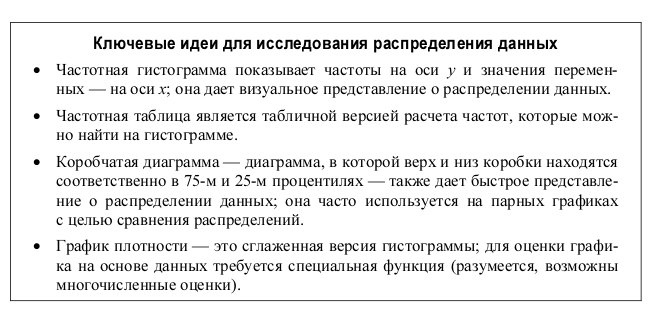

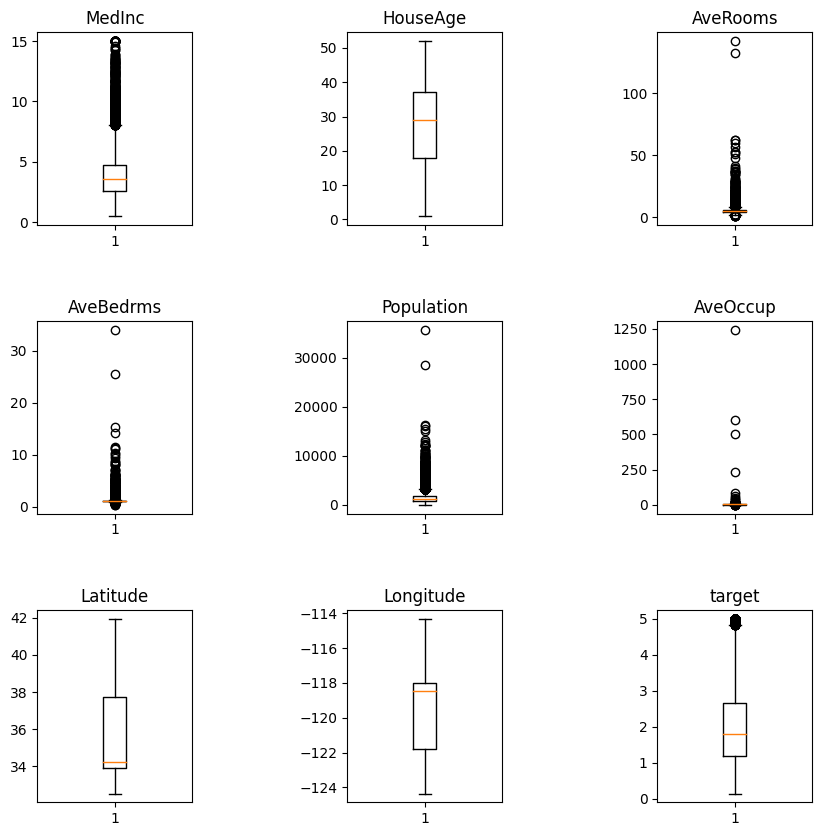

In [75]:
import matplotlib.pyplot as plt

def Box_plot(data):
    fig, axes = plt.subplots(ncols = 3, nrows = 3, figsize = (10,10))
    fig.subplots_adjust(hspace=0.5, wspace = 1)
    columns = [column for column in data.columns]
    dictionary = {i+1 : columns[i] for i in range(len(data.axes[1]))}
    i = 1
    for rows in axes:
        for ax in rows:
            ax.boxplot(data[dictionary[i]])
            ax.set_title(dictionary[i])
            i +=1
Box_plot(data)

In [9]:
data.value_counts() # Таблица частот

MedInc   HouseAge  AveRooms   AveBedrms  Population  AveOccup  Latitude  Longitude  target 
0.4999   10.0      6.740000   2.040000   108.0       2.160000  34.69     -116.90    0.55000    1
4.2500   34.0      6.063910   0.996241   631.0       2.372180  38.53     -121.51    1.91900    1
4.2458   52.0      3.912999   1.064483   1830.0      1.873081  37.80     -122.42    4.50000    1
4.2454   33.0      6.073746   1.064897   1073.0      3.165192  34.12     -117.87    1.83800    1
                   4.604207   1.021033   1644.0      3.143403  33.88     -118.36    2.36800    1
                                                                                              ..
2.8919   52.0      5.140506   1.089873   2290.0      2.898734  34.10     -118.14    2.58400    1
2.8917   33.0      4.699346   1.009804   1378.0      4.503268  34.20     -118.37    1.70400    1
2.8913   23.0      5.038674   0.977901   1146.0      3.165746  36.43     -119.85    0.60900    1
2.8910   11.0      3.764323   1.238

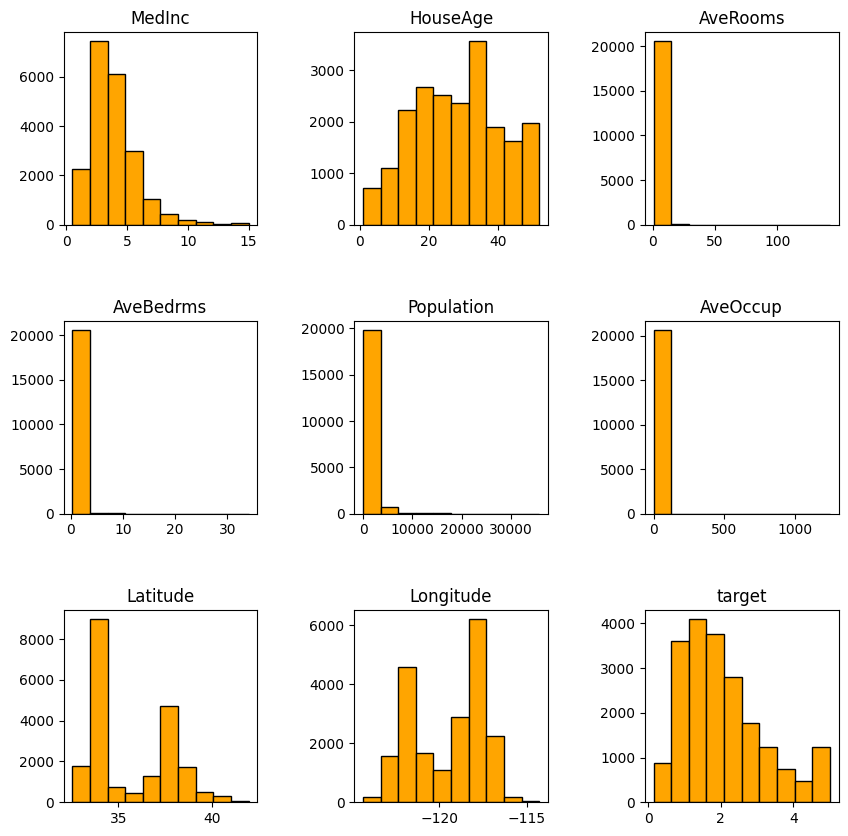

In [77]:
def Histogram(data):
    fig, axes = plt.subplots(ncols = 3, nrows = 3, figsize = (10,10))
    fig.subplots_adjust(hspace=0.5, wspace = 0.5)
    columns = [column for column in data.columns]
    dictionary = {i+1 : columns[i] for i in range(len(data.axes[1]))}
    i = 1
    for rows in axes:
        for ax in rows:
            ax.hist(data[dictionary[i]], color = 'orange', edgecolor = 'black')
            ax.set_title(dictionary[i])
            i +=1
Histogram(data)

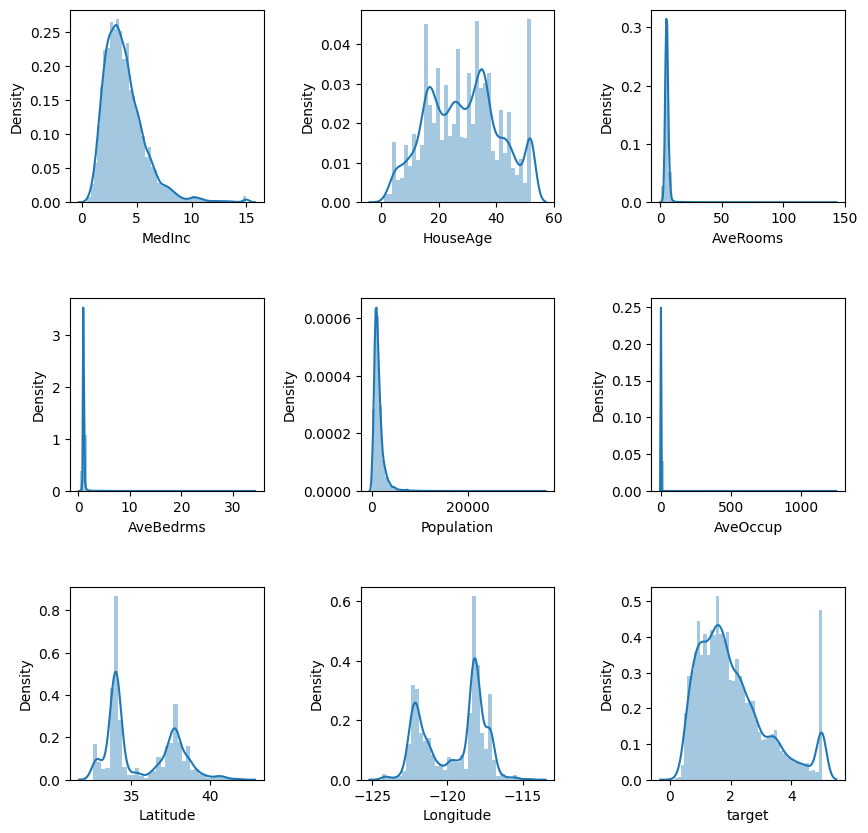

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

def distplot(data): # Диаграмма плотностей частотных диаграмм
    fig, axes = plt.subplots(ncols = 3, nrows = 3, figsize = (10,10))
    fig.subplots_adjust(hspace=0.5, wspace = 0.5)
    columns = [column for column in data.columns]
    dictionary = {i+1 : columns[i] for i in range(len(data.axes[1]))}
    i = 1
    for rows in axes:
        for ax in rows:
            ax = sns.distplot(data[dictionary[i]],hist = True, ax = ax)
            i+=1
    #sns.distplot(data['MedInc'], hist = True)
distplot(data)

## Изучение простых категориальных данных

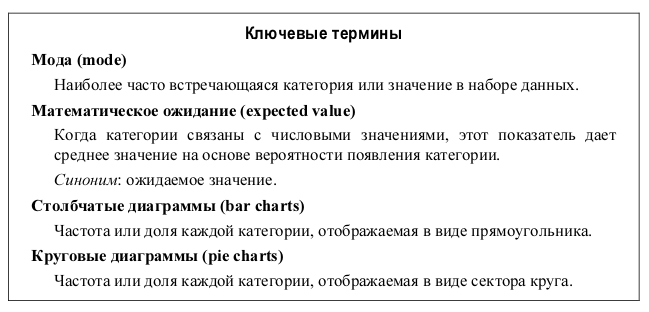

In [12]:
def category_variables(data):
    size = len(data.axes[1])
    modas = [None]*size
    M = [None]*size
    i = 0
    for column in data.columns:
        modas[i] = data[column].mode()
        print(f'{column}: {modas[i]}')
        M[i] = data[column].mean()
        i+=1
    return modas,M

## Корреляция

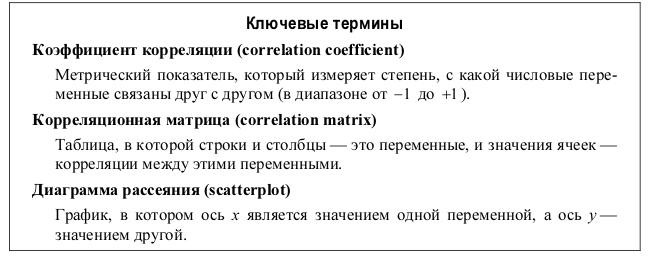

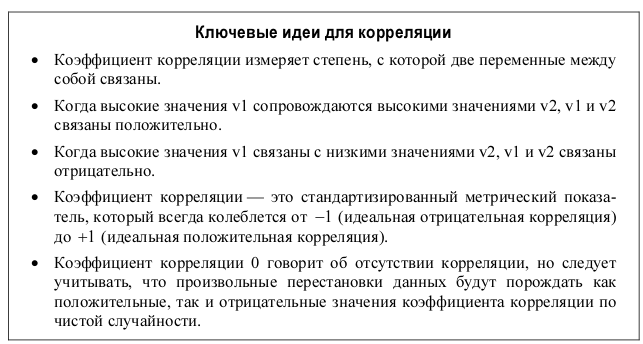

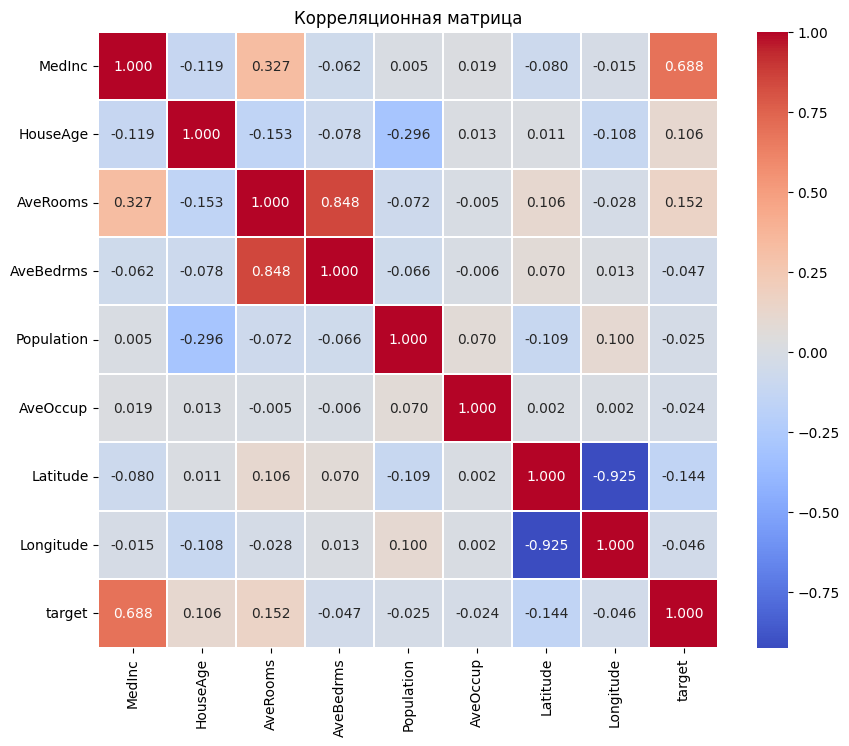

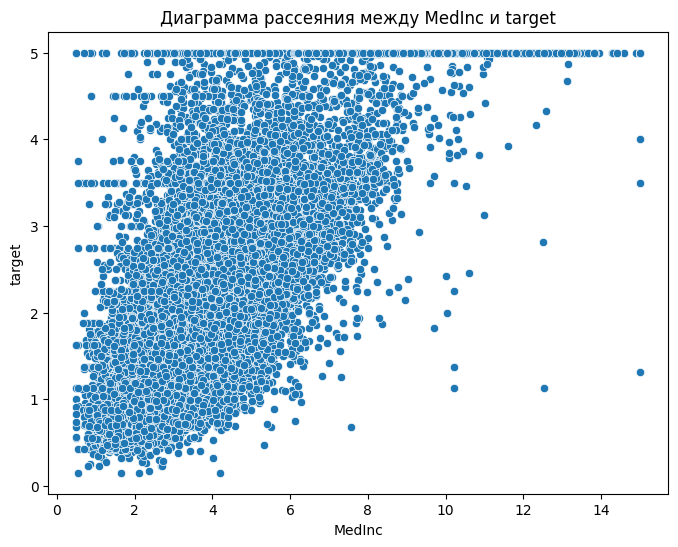

In [22]:
def correlations(data):
    correlations = data.corr()
    plt.figure(figsize = (10,8))
    sns.heatmap(correlations, annot=True, cmap='coolwarm', fmt=".3f", linewidths=0.3)
    plt.title('Корреляционная матрица')
    plt.show()
    
def scatterplot(data, column1, column2):
    plt.figure(figsize=(8, 6))  # Установка размера графика
    sns.scatterplot(x= data[column1], y=data[column2])
    plt.title(f'Диаграмма рассеяния между {column1} и {column2}')  # Заголовок графика
    plt.show()
correlations(data)
scatterplot(data, 'MedInc','target')

## Исследование двух и более переменных

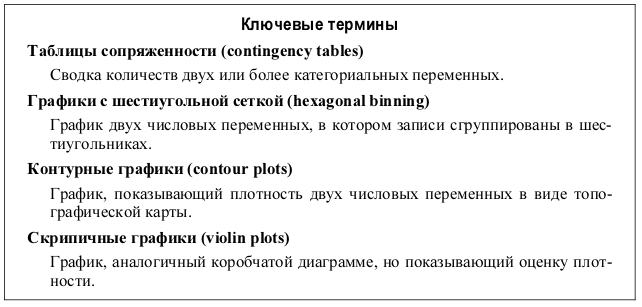

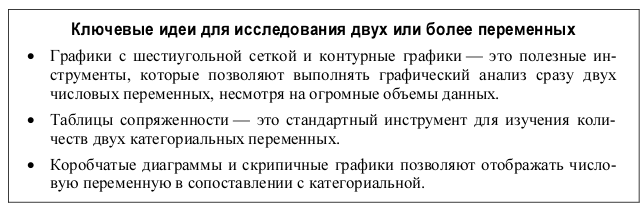

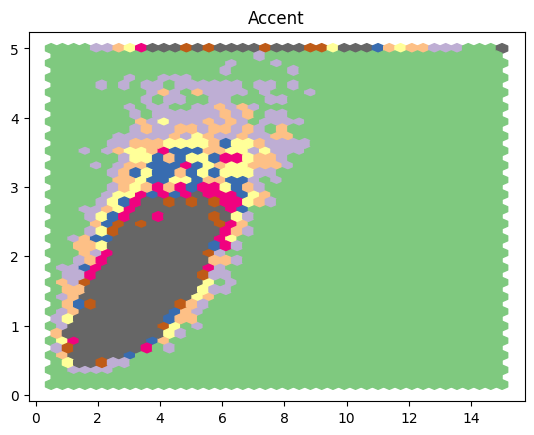

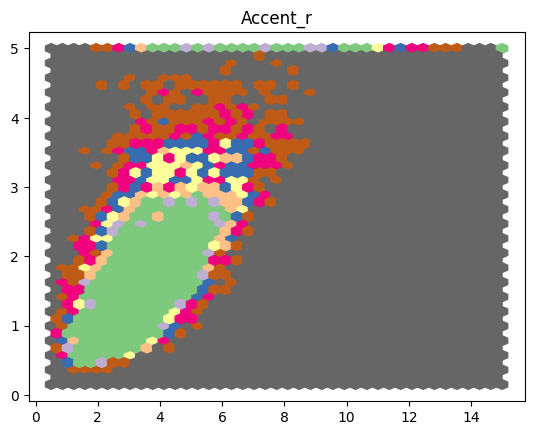

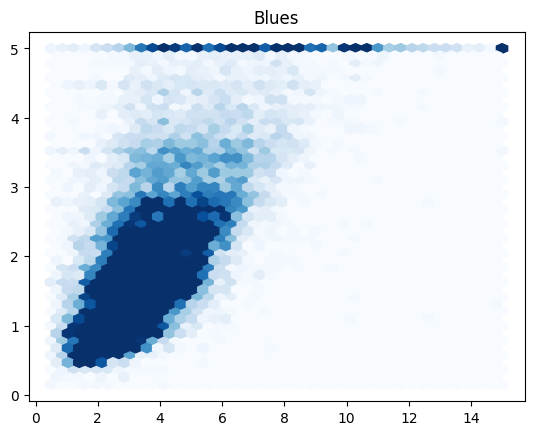

...

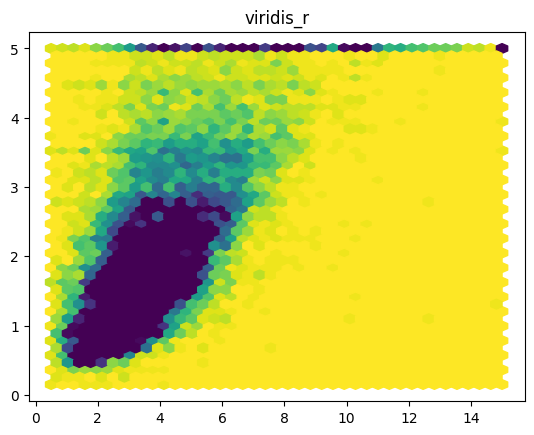

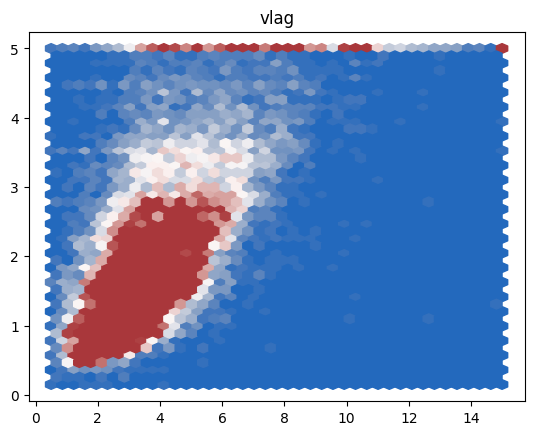

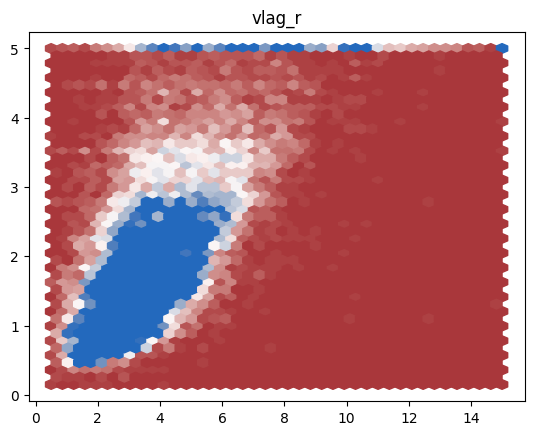

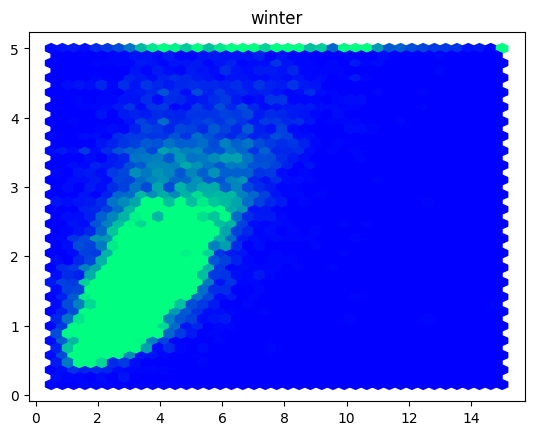

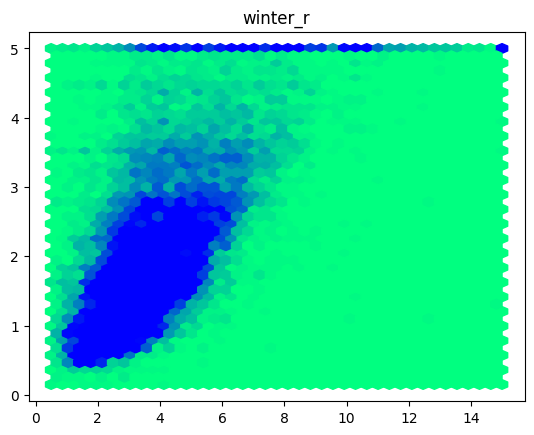

In [75]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


#data.plot.hexbin(x = 'MedInc', y = 'target', edgecolors= 'white')
colors = ['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 
          'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r']
for color in colors:
    plt.hexbin(data['MedInc'], data['target'], cmap = color, gridsize = 40, vmin=0, vmax=40)
    plt.title(color)
    plt.show()
#ocean_r not bad

'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'crest', 'crest_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'flare', 'flare_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r'

In [76]:
def skripplot(data):
    fig, axes = plt.subplots(ncols = 3, nrows = 3, figsize = (10,10))
    fig.subplots_adjust(hspace=0.5, wspace = 1)
    columns = [column for column in data.columns]
    dictionary = {i+1 : columns[i] for i in range(len(data.axes[1]))}
    i = 1
    for rows in axes:
        for ax in rows:
            ax.violinplot(data[dictionary[i]])
            ax.set_title(dictionary[i])
            i +=1  

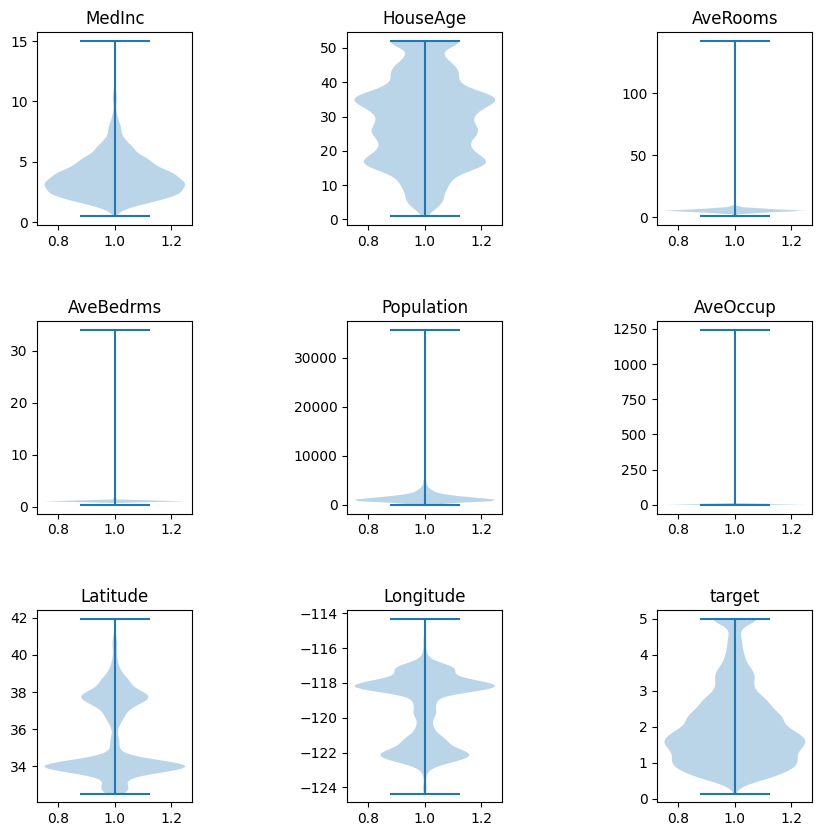

In [77]:
skripplot(data)